In [1]:
# Importing the necessary libraries

import numpy as np # For calculations
import pandas as pd # For data manipulation
import matplotlib.pyplot as plt # For visualization
import seaborn as sns # For visualization
import requests # For requesting access from server
from bs4 import BeautifulSoup # For webscraping
import re # For data cleaning
import json # For json functions

# Web Scraping

In [2]:
# Getting the file and requesting access

url='https://data.cdc.gov/api/views/9j2v-jamp/rows.json?accessType=DOWNLOAD'
req=requests.get(url)
req

# 200 so can proceed

<Response [200]>

In [3]:
# Webscraping the data
data=BeautifulSoup(req.content)
data

<html><body><p>{
  "meta" : {
    "view" : {
      "id" : "9j2v-jamp",
      "name" : "Death rates for suicide, by sex, race, Hispanic origin, and age: United States",
      "assetType" : "dataset",
      "attribution" : "NCHS/DAE",
      "averageRating" : 0,
      "category" : "NCHS",
      "createdAt" : 1621025970,
      "description" : "Data on death rates for suicide, by selected population characteristics. Please refer to the PDF or Excel version of this table in the HUS 2019 Data Finder (https://www.cdc.gov/nchs/hus/contents2019.htm) for critical information about measures, definitions, and changes over time. \n\nSOURCE: NCHS, National  Vital Statistics System (NVSS); Grove RD, Hetzel AM. Vital statistics rates in the United States, 1940â€“1960. National Center for Health Statistics. 1968; numerator data from NVSS annual public-use Mortality Files; denominator data from U.S. Census Bureau national population estimates; and Murphy SL, Xu JQ, Kochanek KD, Arias E, Tejada-Vera B. De

In [4]:
# For better glance
data.prettify()

'<html>\n <body>\n  <p>\n   {\n  "meta" : {\n    "view" : {\n      "id" : "9j2v-jamp",\n      "name" : "Death rates for suicide, by sex, race, Hispanic origin, and age: United States",\n      "assetType" : "dataset",\n      "attribution" : "NCHS/DAE",\n      "averageRating" : 0,\n      "category" : "NCHS",\n      "createdAt" : 1621025970,\n      "description" : "Data on death rates for suicide, by selected population characteristics. Please refer to the PDF or Excel version of this table in the HUS 2019 Data Finder (https://www.cdc.gov/nchs/hus/contents2019.htm) for critical information about measures, definitions, and changes over time. \\n\\nSOURCE: NCHS, National  Vital Statistics System (NVSS); Grove RD, Hetzel AM. Vital statistics rates in the United States, 1940â€“1960. National Center for Health Statistics. 1968; numerator data from NVSS annual public-use Mortality Files; denominator data from U.S. Census Bureau national population estimates; and Murphy SL, Xu JQ, Kochanek KD, A

In [5]:
# Since data relevant data starts with <p> tag
arr=[]
for i in data.findAll('p'):
    arr.append(str(i))

In [6]:
arr[0]

'<p>{\n  "meta" : {\n    "view" : {\n      "id" : "9j2v-jamp",\n      "name" : "Death rates for suicide, by sex, race, Hispanic origin, and age: United States",\n      "assetType" : "dataset",\n      "attribution" : "NCHS/DAE",\n      "averageRating" : 0,\n      "category" : "NCHS",\n      "createdAt" : 1621025970,\n      "description" : "Data on death rates for suicide, by selected population characteristics. Please refer to the PDF or Excel version of this table in the HUS 2019 Data Finder (https://www.cdc.gov/nchs/hus/contents2019.htm) for critical information about measures, definitions, and changes over time. \\n\\nSOURCE: NCHS, National  Vital Statistics System (NVSS); Grove RD, Hetzel AM. Vital statistics rates in the United States, 1940â€“1960. National Center for Health Statistics. 1968; numerator data from NVSS annual public-use Mortality Files; denominator data from U.S. Census Bureau national population estimates; and Murphy SL, Xu JQ, Kochanek KD, Arias E, Tejada-Vera B. D

In [7]:
# Logic for cleaning the tags
re.sub('<p>|</p>','',arr[0])

'{\n  "meta" : {\n    "view" : {\n      "id" : "9j2v-jamp",\n      "name" : "Death rates for suicide, by sex, race, Hispanic origin, and age: United States",\n      "assetType" : "dataset",\n      "attribution" : "NCHS/DAE",\n      "averageRating" : 0,\n      "category" : "NCHS",\n      "createdAt" : 1621025970,\n      "description" : "Data on death rates for suicide, by selected population characteristics. Please refer to the PDF or Excel version of this table in the HUS 2019 Data Finder (https://www.cdc.gov/nchs/hus/contents2019.htm) for critical information about measures, definitions, and changes over time. \\n\\nSOURCE: NCHS, National  Vital Statistics System (NVSS); Grove RD, Hetzel AM. Vital statistics rates in the United States, 1940â€“1960. National Center for Health Statistics. 1968; numerator data from NVSS annual public-use Mortality Files; denominator data from U.S. Census Bureau national population estimates; and Murphy SL, Xu JQ, Kochanek KD, Arias E, Tejada-Vera B. Deat

In [8]:
# Putting data without tags to a list
crr=[]
for i in data.findAll('p'):
    i=re.sub('<p>|</p>','',str(i))
    crr.append(i)

In [9]:
crr

['{\n  "meta" : {\n    "view" : {\n      "id" : "9j2v-jamp",\n      "name" : "Death rates for suicide, by sex, race, Hispanic origin, and age: United States",\n      "assetType" : "dataset",\n      "attribution" : "NCHS/DAE",\n      "averageRating" : 0,\n      "category" : "NCHS",\n      "createdAt" : 1621025970,\n      "description" : "Data on death rates for suicide, by selected population characteristics. Please refer to the PDF or Excel version of this table in the HUS 2019 Data Finder (https://www.cdc.gov/nchs/hus/contents2019.htm) for critical information about measures, definitions, and changes over time. \\n\\nSOURCE: NCHS, National  Vital Statistics System (NVSS); Grove RD, Hetzel AM. Vital statistics rates in the United States, 1940â€“1960. National Center for Health Statistics. 1968; numerator data from NVSS annual public-use Mortality Files; denominator data from U.S. Census Bureau national population estimates; and Murphy SL, Xu JQ, Kochanek KD, Arias E, Tejada-Vera B. Dea

In [10]:
# Using json function to convert into dictionary
# Inserting the data in the list
cleaned=[]
for y in crr:
        dicti=json.loads(y)
        cleaned.append(dicti)

In [11]:
# Using the above list and getting the relevant data
rows = []
for z in cleaned:
    if 'data' in z:
        rows.extend(z['data'])
        
# Relevant data for data set starts with data key

In [13]:
# Now we have access to each row. 
rows[3]

['row-usyq~7vsy~ag46',
 '00000000-0000-0000-DAE8-3BAD17B11C1C',
 0,
 1623083971,
 None,
 1623083971,
 None,
 '{ }',
 'Death rates for suicide',
 'Deaths per 100,000 resident population, age-adjusted',
 '1',
 'Total',
 '0',
 'All persons',
 '0',
 '1980',
 '4',
 'All ages',
 '0',
 '12.2',
 None]

In [14]:
# Creating the data frame

df=pd.DataFrame(rows)

In [15]:
# Displaying the data frame
df

,0,1,2,3,4,5,6,7,8,9,...,11,12,13,14,15,16,17,18,19,20
0,row-sj5k-g243-v6cb,00000000-0000-0000-ED82-9AA08DFD0A9A,0,1623083971,None,1623083971,None,{ },Death rates for suicide,"Deaths per 100,000 resident population, age-ad...",...,Total,0,All persons,0,1950,1,All ages,0,13.2,None
1,row-ejmi~wx6s-9cxn,00000000-0000-0000-6815-4FD0CEFCA3F6,0,1623083971,None,1623083971,None,{ },Death rates for suicide,"Deaths per 100,000 resident population, age-ad...",...,Total,0,All persons,0,1960,2,All ages,0,12.5,None
2,row-db2i-62a7_cm7e,00000000-0000-0000-3CBC-D99BAFDC625B,0,1623083971,None,1623083971,None,{ },Death rates for suicide,"Deaths per 100,000 resident population, age-ad...",...,Total,0,All persons,0,1970,3,All ages,0,13.1,None
3,row-usyq~7vsy~ag46,00000000-0000-0000-DAE8-3BAD17B11C1C,0,1623083971,None,1623083971,None,{ },Death rates for suicide,"Deaths per 100,000 resident population, age-ad...",...,Total,0,All persons,0,1980,4,All ages,0,12.2,None
4,row-susv_w5b7_mr7x,00000000-0000-0000-4D4D-902B4D920BE3,0,1623083971,None,1623083971,None,{ },Death rates for suicide,"Deaths per 100,000 resident population, age-ad...",...,Total,0,All persons,0,1981,5,All ages,0,12.3,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6385,row-3868~iife.snwt,00000000-0000-0000-8180-6FC9C0A4BBDD,0,1623083971,None,1623083971,None,{ },Death rates for suicide,"Deaths per 100,000 resident population, crude",...,"Sex, age and race and Hispanic origin (Single ...",11,Female: Not Hispanic or Latino: Black or Afric...,7.225,2018,42,65 years and over,5,1.3,None
6386,row-rqgk_q3qw_grn6,00000000-0000-0000-5BA7-DC975537C46A,0,1623083971,None,1623083971,None,{ },Death rates for suicide,"Deaths per 100,000 resident population, crude",...,"Sex, age and race and Hispanic origin (Single ...",11,Female: Hispanic or Latino: All races: 15-24 y...,7.232,2018,42,15-24 years,2,4.1,None
6387,row-yp49~mju7-9dka,00000000-0000-0000-6013-6AD3ED22FF09,0,1623083971,None,1623083971,None,{ },Death rates for suicide,"Deaths per 100,000 resident population, crude",...,"Sex, age and race and Hispanic origin (Single ...",11,Female: Hispanic or Latino: All races: 25-44 y...,7.233,2018,42,25-44 years,3,4.4,None
6388,row-yrr2_89hh.am8m,00000000-0000-0000-383B-FA52D078E4A7,0,1623083971,None,1623083971,None,{ },Death rates for suicide,"Deaths per 100,000 resident population, crude",...,"Sex, age and race and Hispanic origin (Single ...",11,Female: Hispanic or Latino: All races: 45-64 y...,7.234,2018,42,45-64 years,4,3.2,None


In [16]:
# Dropping un necessary columns
df.drop([0,1,2,3,4,5,6],axis=1,inplace=True)

In [17]:
# Dropping further unnecessary columns
df.drop([7,8,9,10,11,12,14,16,18,20],axis=1,inplace=True)

In [18]:
# Displaying after dropping
df

,13,15,17,19
0,All persons,1950,All ages,13.2
1,All persons,1960,All ages,12.5
2,All persons,1970,All ages,13.1
3,All persons,1980,All ages,12.2
4,All persons,1981,All ages,12.3
...,...,...,...,...
6385,Female: Not Hispanic or Latino: Black or Afric...,2018,65 years and over,1.3
6386,Female: Hispanic or Latino: All races: 15-24 y...,2018,15-24 years,4.1
6387,Female: Hispanic or Latino: All races: 25-44 y...,2018,25-44 years,4.4
6388,Female: Hispanic or Latino: All races: 45-64 y...,2018,45-64 years,3.2


In [19]:
# Changing the column names
columns=["Gender","Year","Age_Criteria","Death_Rate(Per 100,000)"]
df.columns=columns

In [20]:
# Displaying after changing
df

,Gender,Year,Age_Criteria,"Death_Rate(Per 100,000)"
0,All persons,1950,All ages,13.2
1,All persons,1960,All ages,12.5
2,All persons,1970,All ages,13.1
3,All persons,1980,All ages,12.2
4,All persons,1981,All ages,12.3
...,...,...,...,...
6385,Female: Not Hispanic or Latino: Black or Afric...,2018,65 years and over,1.3
6386,Female: Hispanic or Latino: All races: 15-24 y...,2018,15-24 years,4.1
6387,Female: Hispanic or Latino: All races: 25-44 y...,2018,25-44 years,4.4
6388,Female: Hispanic or Latino: All races: 45-64 y...,2018,45-64 years,3.2


In [21]:
# Checking categories of the column
df["Gender"].value_counts()

# We can see this column has:
# Gender Info
# Race Info
# Age Info

Gender
Female: Black or African American                                                               87
Male: Hispanic or Latino: All races                                                             86
Female: Hispanic or Latino: All races                                                           86
Male: White                                                                                     86
Male: American Indian or Alaska Native                                                          86
                                                                                                ..
Male: Not Hispanic or Latino: Native Hawaiian or Other Pacific Islander: 15-24 years             1
Male: Not Hispanic or Latino: Asian: 45-64 years                                                 1
Male: Not Hispanic or Latino: Asian: 25-44 years                                                 1
Male: Not Hispanic or Latino: Asian: 15-24 years                                                 1
Fem

In [22]:
# Since we have ages in another column already we replace the digits
df["Gender"]=df["Gender"].str.replace('\d{2}-\d+ years','',regex=True)

In [23]:
# Displaying after cleaning
df["Gender"].value_counts()

# We still have age

Gender
Male:                                                                                           504
                                                                                                504
Female:                                                                                         504
Male: Black or African American:                                                                217
Male: White:                                                                                    215
                                                                                               ... 
Male: Not Hispanic or Latino: Asian                                                               2
Male: Not Hispanic or Latino: Asian: 65 years and over                                            1
Male: Not Hispanic or Latino: Native Hawaiian or Other Pacific Islander: 65 years and over        1
Female: Not Hispanic or Latino: Asian: 65 years and over                                     

In [24]:
# Replacing age
df["Gender"]=df["Gender"].str.replace('\d{2} years and over','',regex=True)

In [25]:
# Checking after replacing
df["Gender"].value_counts()

# We now have 
# Gender data
# Race data

Gender
                                                                               588
Female:                                                                        588
Male:                                                                          588
Male: Black or African American:                                               305
Male: White:                                                                   301
Female: Black or African American:                                             176
Female: Not Hispanic or Latino: White:                                         172
Female: White:                                                                 172
Male: Not Hispanic or Latino: White:                                           172
Male: Hispanic or Latino: All races:                                           172
Male: Not Hispanic or Latino: Black or African American:                       172
Female: Hispanic or Latino: All races:                                         1

In [26]:
# Creating new column from gender column
df["Race"]=df["Gender"]

In [27]:
# Displaying after creating new column
df

,Gender,Year,Age_Criteria,"Death_Rate(Per 100,000)",Race
0,All persons,1950,All ages,13.2,All persons
1,All persons,1960,All ages,12.5,All persons
2,All persons,1970,All ages,13.1,All persons
3,All persons,1980,All ages,12.2,All persons
4,All persons,1981,All ages,12.3,All persons
...,...,...,...,...,...
6385,Female: Not Hispanic or Latino: Black or Afric...,2018,65 years and over,1.3,Female: Not Hispanic or Latino: Black or Afric...
6386,Female: Hispanic or Latino: All races:,2018,15-24 years,4.1,Female: Hispanic or Latino: All races:
6387,Female: Hispanic or Latino: All races:,2018,25-44 years,4.4,Female: Hispanic or Latino: All races:
6388,Female: Hispanic or Latino: All races:,2018,45-64 years,3.2,Female: Hispanic or Latino: All races:


In [28]:
# Now we can remove the race info in gender column
df["Gender"]=df["Gender"].str.replace(':.*','',regex=True)

In [29]:
# Gender column after cleaning
df["Gender"].value_counts()

Gender
Male           2987
Female         2731
                588
All persons      84
Name: count, dtype: int64

In [30]:
# Checking age column
df["Age_Criteria"].value_counts()

Age_Criteria
All ages             1624
15-24 years           812
25-44 years           812
45-64 years           812
65 years and over     812
65-74 years           212
75-84 years           212
85 years and over     212
10-14 years           126
15-19 years           126
20-24 years           126
25-34 years           126
35-44 years           126
45-54 years           126
55-64 years           126
Name: count, dtype: int64

In [31]:
# Checking for null values
df["Death_Rate(Per 100,000)"].isnull().sum()

906

In [32]:
# Now we will clean race column
df["Race"].value_counts()

# It has 
# Gender info
# Race info

Race
                                                                               588
Female:                                                                        588
Male:                                                                          588
Male: Black or African American:                                               305
Male: White:                                                                   301
Female: Black or African American:                                             176
Female: Not Hispanic or Latino: White:                                         172
Female: White:                                                                 172
Male: Not Hispanic or Latino: White:                                           172
Male: Hispanic or Latino: All races:                                           172
Male: Not Hispanic or Latino: Black or African American:                       172
Female: Hispanic or Latino: All races:                                         172

In [33]:
# Replacing gender info (Female)
df["Race"]=df["Race"].str.replace('Female:','',regex=True)

In [34]:
# Replacing gender info (male)
df["Race"]=df["Race"].str.replace('Male:','',regex=True)

In [36]:
# We can still some gender data so replacing
df["Race"]=df["Race"].str.replace('Male','',regex=True)

In [37]:
df["Race"]=df["Race"].str.replace('Female','',regex=True)

In [38]:
df["Race"]=df["Race"].str.replace('All persons','',regex=True)

In [39]:
# Checking:
df["Race"].value_counts()

Race
                                                                        1176
                                                                         840
 Black or African American:                                              481
 White:                                                                  473
 Hispanic or Latino: All races:                                          344
 Not Hispanic or Latino: Black or African American:                      344
 Not Hispanic or Latino: White:                                          344
 Asian or Pacific Islander:                                              336
 American Indian or Alaska Native:                                       336
 White                                                                   172
 American Indian or Alaska Native                                        172
 Black or African American                                               172
 Hispanic or Latino: All races                                         

# Replacing 


In [40]:
# Below the data are quite same but due so spaces and : 
# The data has been categorize differently

df["Race"]=df["Race"].replace('White ','White',regex=True)

In [41]:
df["Race"]=df["Race"].replace('American Indian or Alaska Native ','American Indian or Alaska Native',regex=True)

In [42]:
df["Race"]=df["Race"].replace('Black or African American ','Black or African American',regex=True)

In [43]:
df["Race"]=df["Race"].replace('Hispanic or Latino: All races ','Hispanic or Latino: All races',regex=True)

In [44]:
df["Race"]=df["Race"].replace('Not Hispanic or Latino: Black or African American ','Not Hispanic or Latino: Black or African American',regex=True)

In [45]:
df["Race"]=df["Race"].replace('Not Hispanic or Latino: White ','Not Hispanic or Latino: White',regex=True)

In [46]:
df["Race"]=df["Race"].replace('Asian or Pacific Islander ','Asian or Pacific Islander',regex=True)

In [47]:
df["Race"]=df["Race"].replace('Not Hispanic or Latino: Asian or Pacific Islander ','Not Hispanic or Latino: Asian or Pacific Islander',regex=True)

In [48]:
df["Race"]=df["Race"].replace('Not Hispanic or Latino: Asian ','Not Hispanic or Latino: Asian',regex=True)

In [49]:
df["Race"]=df["Race"].replace('Not Hispanic or Latino: Native Hawaiian or Other Pacific Islander ','Not Hispanic or Latino: Native Hawaiian or Other Pacific Islander',regex=True)

In [50]:
# Displaying after cleaning
df["Race"].value_counts()

Race
                                                                        1176
                                                                         840
 Black or African American:                                              481
 White:                                                                  473
 Hispanic or Latino: All races:                                          344
 Not Hispanic or Latino: Black or African American:                      344
 Not Hispanic or Latino: White:                                          344
 Asian or Pacific Islander:                                              336
 American Indian or Alaska Native:                                       336
 White                                                                   172
 American Indian or Alaska Native                                        172
 Black or African American                                               172
 Hispanic or Latino: All races                                         

In [51]:
# We can identify some have common names like
# Black or African American and Not Hispanic or Latino: Black or African American
df["Race"].unique()

array(['', ' White', ' Black or African American',
       ' American Indian or Alaska Native', ' Asian or Pacific Islander',
       ' Not Hispanic or Latino: White',
       ' Not Hispanic or Latino: Black or African American',
       ' Hispanic or Latino: All races',
       ' Not Hispanic or Latino: American Indian or Alaska Native',
       ' Not Hispanic or Latino: Asianor Pacific Islander',
       ' Not Hispanic or Latino: Asian',
       ' Not Hispanic or Latino: Native Hawaiian or Other Pacific Islander',
       ' ', ' White: ', ' Black or African American: ',
       ' American Indian or Alaska Native: ',
       ' Asian or Pacific Islander: ',
       ' Not Hispanic or Latino: American Indian or Alaska Native: ',
       ' Not Hispanic or Latino: White: ',
       ' Not Hispanic or Latino: Asianor Pacific Islander: ',
       ' Not Hispanic or Latino: Black or African American: ',
       ' Hispanic or Latino: All races: ',
       ' Not Hispanic or Latino: Asian: ',
       ' Not Hispanic

In [89]:
# Replacing the common names

df["Race"]=df["Race"].replace({
' ':'Not Given',
' Not Hispanic or Latino: Black or African American: ':'Black or African American',
' Not Hispanic or Latino: White: ':'White',
' Not Hispanic or Latino: American Indian or Alaska Native: ':'American Indian or Alaska Native',
' Not Hispanic or Latino: Asianor Pacific Islander: ':'Asian or Pacific Islander',
' Not Hispanic or Latino: Asian: ':'Asian',
' Not Hispanic or Latino: Native Hawaiian or Other Pacific Islander: ':'Native Hawaiian or Other Pacific Islander'},
regex=False)

In [87]:
# Further cleaning for ones separated by spaces
df["Race"]=df["Race"].replace({
' White: ':'White',
"Not Given":'',
' American Indian or Alaska Native: ':'American Indian or Alaska Native',
' Black or African American: ':'Black or African American',
' Asian or Pacific Islander: ':'Asian or Pacific Islander',
' Hispanic or Latino: All races: ':'Hispanic or Latino: All races'
},regex=False)

In [90]:
df["Race"].unique()

array(['', 'White', 'Black or African American',
       'American Indian or Alaska Native', 'Asian or Pacific Islander',
       'Hispanic or Latino: All races', 'Asian',
       'Native Hawaiian or Other Pacific Islander'], dtype=object)

In [54]:
# Checking dtypes
df.dtypes

Gender                     object
Year                       object
Age_Criteria               object
Death_Rate(Per 100,000)    object
Race                       object
dtype: object

In [55]:
# Converting relevant column 
df["Death_Rate(Per 100,000)"]=pd.to_numeric(df["Death_Rate(Per 100,000)"])

In [56]:
# After converting
df.dtypes

Gender                      object
Year                        object
Age_Criteria                object
Death_Rate(Per 100,000)    float64
Race                        object
dtype: object

# Analyzing Data


In [91]:
# To check the max death rate based on race
df.groupby("Race")["Death_Rate(Per 100,000)"].agg('max').head(10)

Race
                                             69.5
American Indian or Alaska Native             60.7
Asian                                        15.5
Asian or Pacific Islander                    20.4
Black or African American                    21.8
Hispanic or Latino: All races                28.5
Native Hawaiian or Other Pacific Islander    38.1
White                                        74.8
Name: Death_Rate(Per 100,000), dtype: float64

In [92]:
# To display in the descdening order
df.groupby("Race")["Death_Rate(Per 100,000)"].agg('max').sort_values(ascending=False).head(10)

Race
White                                        74.8
                                             69.5
American Indian or Alaska Native             60.7
Native Hawaiian or Other Pacific Islander    38.1
Hispanic or Latino: All races                28.5
Black or African American                    21.8
Asian or Pacific Islander                    20.4
Asian                                        15.5
Name: Death_Rate(Per 100,000), dtype: float64

In [93]:
# To display max death rate based on Gender
df.groupby("Gender")["Death_Rate(Per 100,000)"].agg('max').sort_values(ascending=False)

Gender
Male           74.8
               31.1
Female         20.7
All persons    14.8
Name: Death_Rate(Per 100,000), dtype: float64

In [60]:
# To display max death rate based on age
df.groupby("Age_Criteria")["Death_Rate(Per 100,000)"].agg('max').sort_values(ascending=False)

Age_Criteria
85 years and over    74.8
75-84 years          61.9
15-24 years          60.7
25-44 years          60.2
65 years and over    55.8
65-74 years          53.2
55-64 years          43.6
45-64 years          39.5
All ages             34.8
45-54 years          32.0
35-44 years          28.1
20-24 years          28.0
25-34 years          27.6
15-19 years          18.1
10-14 years           3.7
Name: Death_Rate(Per 100,000), dtype: float64

In [61]:
# To display sum of death rates per year
df.groupby("Year")["Death_Rate(Per 100,000)"].agg('sum')

Year
1950    1259.3
1960    1180.5
1970    1181.2
1980    1394.0
1981    1207.3
1982    1224.4
1983    1245.7
1984    1266.9
1985    1775.0
1986    1653.4
1987    1657.7
1988    1796.1
1989    1810.5
1990    1816.6
1991    1808.3
1992    1725.8
1993    1764.8
1994    1746.4
1995    1703.4
1996    1654.7
1997    1611.7
1998    1592.9
1999    1813.1
2000    1779.4
2001    1795.0
2002    1815.1
2003    1787.4
2004    1867.3
2005    1825.2
2006    1818.6
2007    1833.3
2008    1885.9
2009    1920.6
2010    1985.1
2011    1978.3
2012    2033.5
2013    2053.6
2014    2111.2
2015    2214.2
2016    2267.4
2017    2363.6
2018    3960.2
Name: Death_Rate(Per 100,000), dtype: float64

# Data Visualization

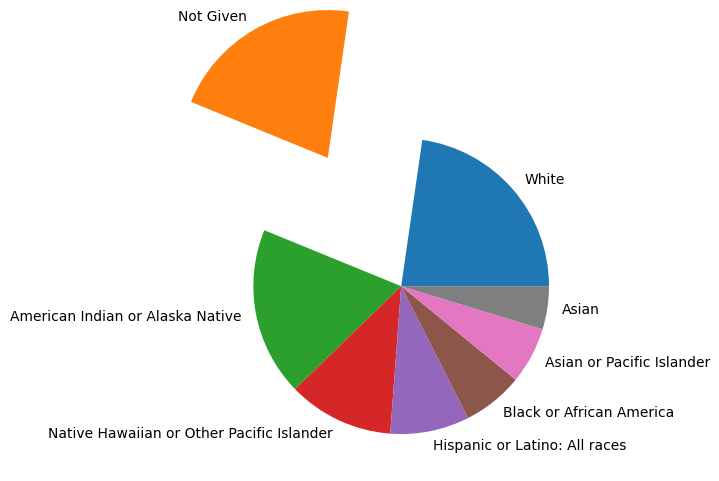

In [94]:
# Pie chart for max death rate based on race
plot=plt.pie(df.groupby("Race")["Death_Rate(Per 100,000)"].agg('max').sort_values(ascending=False),
             labels=["White","Not Given","American Indian or Alaska Native",
                     "Native Hawaiian or Other Pacific Islander",
                     "Hispanic or Latino: All races","Black or African America",
                     "Asian or Pacific Islander","Asian"],explode=[0,1,0,0,0,0,0,0])


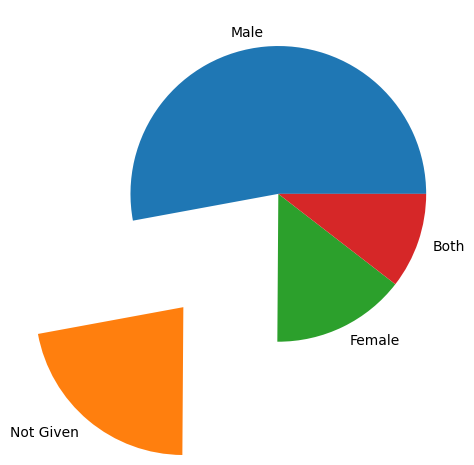

In [95]:
# Pie chart for max death rate based on gender
plot2=plt.pie(df.groupby("Gender")["Death_Rate(Per 100,000)"].agg('max').sort_values(ascending=False),
             labels=["Male","Not Given","Female",'Both'],explode=[0,1,0,0])

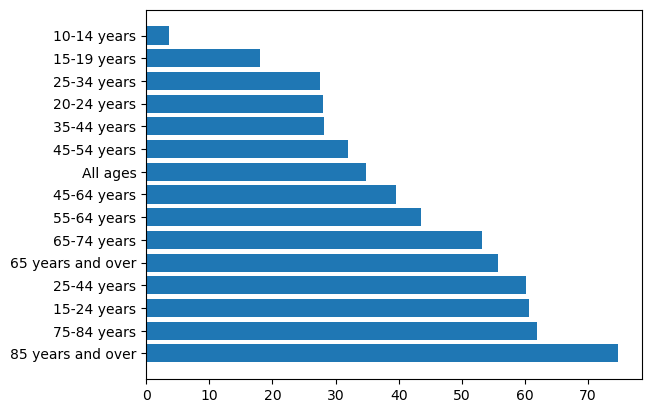

In [96]:
# Horizantol Barchart for max death rate based on age criteria

G=df.groupby("Age_Criteria")["Death_Rate(Per 100,000)"].agg('max').sort_values(ascending=False)
plot3=plt.barh(G.index,G.values)

In [97]:
D=df.groupby("Year")["Death_Rate(Per 100,000)"].agg('sum')
E=D[0:10]
F=D[10:20]
G=D[20:30]
H=D[30:42]

Text(0.5, 1.0, '2007-2018')

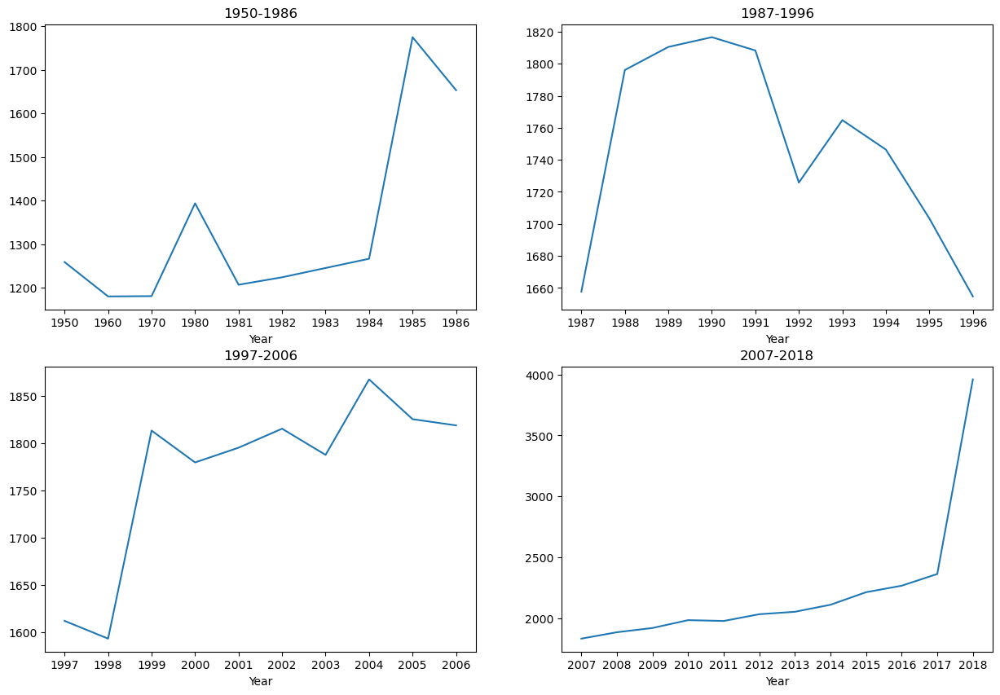

In [98]:
# Using subplots and line plots
# Displaying per slicing made 

# Increasing figure size
plt.figure(figsize=(15,10))

# First plot
plt.subplot(2,2,1)
sns.lineplot(x=E.index,y=E.values,data=E)
plt.title("1950-1986")

# Second Plot
plt.subplot(2,2,2)
sns.lineplot(x=F.index,y=F.values,data=F)
plt.title("1987-1996")

# Third plot
plt.subplot(2,2,3)
sns.lineplot(x=G.index,y=G.values,data=G)
plt.title("1997-2006")

# Fourth Plot
plt.subplot(2,2,4)
sns.lineplot(x=H.index,y=H.values,data=H)
plt.title("2007-2018")